# Exercise: The Price of Weed

#### Summary

Find out how marijuana prices change over time and place in the United States

#### Data Source(s)

Data scraped from http://www.priceofweed.com/, GitHub repository at, https://github.com/frankbi/price-of-weed

Marijuana laws by state from https://data.world/sya/marijuana-laws-by-state

#### Files

- Lots of csvs in data/, formatted at DDMMYYY.csv, daily prices for different states
- `state_marijuana_laws_10_2016.csv`, marijuana laws by state

#### Data dictionary

- **State** the state name
- **HighQ** high quality marijuana, price per ounce
- **HighQN** high quality marijuana, sample size 
- **MedQ** medium quality marijuana, price per ounce
- **MedQN** medium quality marijuana, sample size
- **LowQ** low quality marijuana, price per ounce
- **LowQN** low quality marijuana, sample size

#### Skills

- Reading in many many files
- Combining multiple dataframes
- Cleaning up columns
- Customizing matplotlib graphs

# Read in `data/weedprices01012015.csv`

In [110]:
import pandas as pd
import numpy as np
import re
import statistics
%matplotlib inline

In [111]:
df = pd.read_csv('data/weedprices01012015.csv')
df

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN
0,Alabama,337.54,1539,208.24,1463,I feel bad for these guys -->,182
1,Alaska,303.02,350,270.45,475,I feel bad for these guys -->,37
2,Arizona,298.51,2638,209.43,2426,I feel bad for these guys -->,306
3,Arkansas,341.68,846,207.20,836,I feel bad for these guys -->,145
4,California,243.96,16512,189.35,19151,I feel bad for these guys -->,1096
5,Colorado,243.72,3148,195.11,2877,I feel bad for these guys -->,178
6,Connecticut,337.26,1835,267.99,2069,I feel bad for these guys -->,126
7,Delaware,364.19,490,234.72,431,I feel bad for these guys -->,41
8,District of Columbia,348.66,657,281.93,578,I feel bad for these guys -->,49
9,Florida,300.88,9369,217.05,8166,I feel bad for these guys -->,695


## Cleaning things up

I have no idea what the whole "I feel bad for these guys" means, but *it certainly isn't good data*. It should probably be NaN instead: I'll let you decide how you're going to fix that one.

In [112]:
df['LowQ'].replace('I feel bad for these guys -->', np.nan, inplace=True)

In [113]:
df

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN
0,Alabama,337.54,1539,208.24,1463,NaN,182
1,Alaska,303.02,350,270.45,475,NaN,37
2,Arizona,298.51,2638,209.43,2426,NaN,306
3,Arkansas,341.68,846,207.20,836,NaN,145
4,California,243.96,16512,189.35,19151,NaN,1096
5,Colorado,243.72,3148,195.11,2877,NaN,178
6,Connecticut,337.26,1835,267.99,2069,NaN,126
7,Delaware,364.19,490,234.72,431,NaN,41
8,District of Columbia,348.66,657,281.93,578,NaN,49
9,Florida,300.88,9369,217.05,8166,NaN,695


## Graph the top 10 least expensive states for high quality marijuana

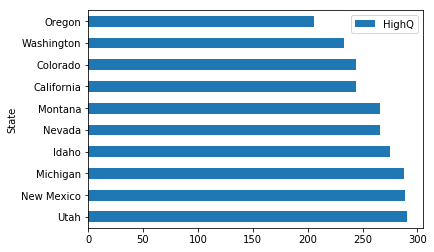

In [114]:
df[['State','HighQ']].sort_values(by='HighQ', ascending=False).tail(10).plot(kind="barh", x='State')

## Graph the top 5 least expensive and the top 5 most expensive states for high quality marijuana, in one graph

You'll probably need to make a new dataframe out of the first 5 and last 5.

In [115]:
top5_highq = df[[ 'State','HighQ']].sort_values(by='HighQ', ascending=False).tail()

In [116]:
tail5_highq = df[[ 'State','HighQ']].sort_values(by='HighQ', ascending=False).head()

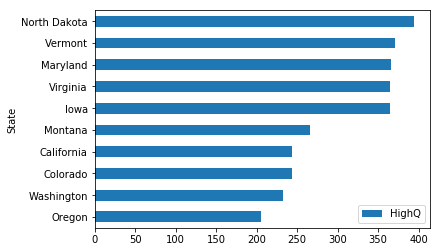

In [117]:
pd.concat([top5_highq, tail5_highq], ignore_index=True).sort_values(by='HighQ', ascending=True).plot(kind='barh', x='State')

## Now go back and make one of those graphs look nice!

- Add a title
- Add a label to the bottom axis
- Remove the label on the left axis
- Remove the legend
- Get rid of the boxes around everything
- Remove most of the tick marks
- Add dollar signs for the bottom

For tips, just ask me and/or use

- https://matplotlib.org/gallery.html
- Especially https://matplotlib.org/examples/ticks_and_spines/spines_demo.html

To format numbers, you can use something that might look a little familiar

```python
import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("${x:,.0f}"))
```

In [270]:
import matplotlib.ticker as ticker

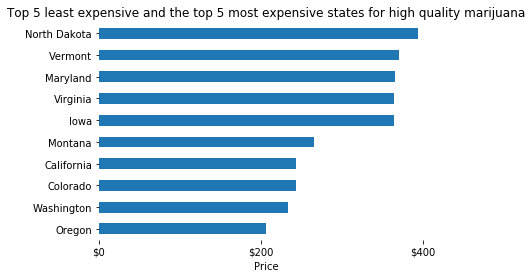

In [289]:
ax = pd.concat([top5_highq, tail5_highq], ignore_index=True).sort_values(by='HighQ', ascending=True).plot(kind='barh', x='State')
ax.set_title("Top 5 least expensive and the top 5 most expensive states for high quality marijuana")
ax.set_xlabel('Price')
ax.set_ylabel('')
ax.legend_.remove()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.xaxis.set_ticks([0, 200, 400])
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("${x:,.0f}"))

# Reading in many many files

## Finding the filenames

Make a list of the filenames of every single CSV files inside of the `data` directory. Don't type them out.

If you do this correctly you will have a list of **491** filenames.

In [120]:
import glob
filenames = glob.glob("data/*.csv")
filenames

['data/weedprices01012014.csv',
 'data/weedprices01012015.csv',
 'data/weedprices01022014.csv',
 'data/weedprices01022015.csv',
 'data/weedprices01032014.csv',
 'data/weedprices01042014.csv',
 'data/weedprices01052014.csv',
 'data/weedprices01062014.csv',
 'data/weedprices01062015.csv',
 'data/weedprices01072014.csv',
 'data/weedprices01072015.csv',
 'data/weedprices01082014.csv',
 'data/weedprices01092014.csv',
 'data/weedprices01102014.csv',
 'data/weedprices01112014.csv',
 'data/weedprices01122014.csv',
 'data/weedprices02012014.csv',
 'data/weedprices02012015.csv',
 'data/weedprices02022014.csv',
 'data/weedprices02022015.csv',
 'data/weedprices02032014.csv',
 'data/weedprices02042014.csv',
 'data/weedprices02052014.csv',
 'data/weedprices02062014.csv',
 'data/weedprices02062015.csv',
 'data/weedprices02072014.csv',
 'data/weedprices02072015.csv',
 'data/weedprices02092014.csv',
 'data/weedprices02102014.csv',
 'data/weedprices02112014.csv',
 'data/weedprices02122014.csv',
 'data/w

## Turn them into dataframes

Read each of them in, converting them to a **list of dataframes**. Save as `price_dfs`.

- Tip: List comprehensions would be good here

In [121]:
price_dfs = [pd.read_csv(filename) for filename in filenames]
len(price_dfs)

491

## Examing the results

Look at the first 2 rows of the first dataframe.

Look at the first 2 rows of the last dataframe.

**If we combined them, could we tell them apart?**

In [122]:
price_dfs[0].head(2)

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN
0,Alabama,$339.06,1042,$198.64,933,$149.49,123
1,Alaska,$288.75,252,$260.6,297,$388.58,26


In [123]:
price_dfs[-1].head(2)

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN
0,Alabama,337.54,1539,208.15,1460,I feel bad for these guys -->,182
1,Alaska,303.02,350,270.45,475,I feel bad for these guys -->,37


## Making them identifiable

Each dataframe needs to have a column thats says the date. Or, actually... let's just save the filename as a column.

You **could** do it like this.

```python
# Take the first dataframe, which was made from the first filename
# Create a new 'filename' column using the first filename
price_dfs[0]['filename'] = filenames[0]
# Take the second dataframe, which was made from the second filename
# Create a new 'filename' column using the second filename
price_dfs[1]['filename'] = filenames[1]
# Take the third dataframe, which was made from the third filename
# Create a new 'filename' column using the third filename
price_dfs[2]['filename'] = filenames[2]
```

But that way is **not any fun**, and would take too long. I have a faster way.

In [126]:
for filename, price_df in zip(filenames, price_dfs):
    print('looking at', filename)
    price_df['filename'] = filename

looking at data/weedprices01012014.csv
looking at data/weedprices01012015.csv
looking at data/weedprices01022014.csv
looking at data/weedprices01022015.csv
looking at data/weedprices01032014.csv
looking at data/weedprices01042014.csv
looking at data/weedprices01052014.csv
looking at data/weedprices01062014.csv
looking at data/weedprices01062015.csv
looking at data/weedprices01072014.csv
looking at data/weedprices01072015.csv
looking at data/weedprices01082014.csv
looking at data/weedprices01092014.csv
looking at data/weedprices01102014.csv
looking at data/weedprices01112014.csv
looking at data/weedprices01122014.csv
looking at data/weedprices02012014.csv
looking at data/weedprices02012015.csv
looking at data/weedprices02022014.csv
looking at data/weedprices02022015.csv
looking at data/weedprices02032014.csv
looking at data/weedprices02042014.csv
looking at data/weedprices02052014.csv
looking at data/weedprices02062014.csv
looking at data/weedprices02062015.csv
looking at data/weedprice

looking at data/weedprices20122014.csv
looking at data/weedprices21012014.csv
looking at data/weedprices21012015.csv
looking at data/weedprices21022014.csv
looking at data/weedprices21032014.csv
looking at data/weedprices21042014.csv
looking at data/weedprices21052014.csv
looking at data/weedprices21052015.csv
looking at data/weedprices21062014.csv
looking at data/weedprices21062015.csv
looking at data/weedprices21072014.csv
looking at data/weedprices21072015.csv
looking at data/weedprices21082014.csv
looking at data/weedprices21092014.csv
looking at data/weedprices21102014.csv
looking at data/weedprices21112014.csv
looking at data/weedprices21122014.csv
looking at data/weedprices22012014.csv
looking at data/weedprices22012015.csv
looking at data/weedprices22022014.csv
looking at data/weedprices22032014.csv
looking at data/weedprices22042014.csv
looking at data/weedprices22052014.csv
looking at data/weedprices22052015.csv
looking at data/weedprices22062014.csv
looking at data/weedprice

In [128]:
price_dfs[0].head()

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN,filename
0,Alabama,$339.06,1042,$198.64,933,$149.49,123,data/weedprices01012014.csv
1,Alaska,$288.75,252,$260.6,297,$388.58,26,data/weedprices01012014.csv
2,Arizona,$303.31,1941,$209.35,1625,$189.45,222,data/weedprices01012014.csv
3,Arkansas,$361.85,576,$185.62,544,$125.87,112,data/weedprices01012014.csv
4,California,$248.78,12096,$193.56,12812,$192.92,778,data/weedprices01012014.csv


## Combine all 491 dataframes into one dataframe

Confirm it has **24990 rows and 8 columns.**

In [131]:
df_total = pd.concat(price_dfs, ignore_index=True)
df_total

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN,filename
0,Alabama,$339.06,1042,$198.64,933,$149.49,123,data/weedprices01012014.csv
1,Alaska,$288.75,252,$260.6,297,$388.58,26,data/weedprices01012014.csv
2,Arizona,$303.31,1941,$209.35,1625,$189.45,222,data/weedprices01012014.csv
3,Arkansas,$361.85,576,$185.62,544,$125.87,112,data/weedprices01012014.csv
4,California,$248.78,12096,$193.56,12812,$192.92,778,data/weedprices01012014.csv
5,Colorado,$236.31,2161,$195.29,1728,$213.5,128,data/weedprices01012014.csv
6,Connecticut,$347.9,1294,$273.97,1316,$257.36,91,data/weedprices01012014.csv
7,Delaware,$373.18,347,$226.25,273,$199.88,34,data/weedprices01012014.csv
8,District of Columbia,$352.26,433,$295.67,349,$213.72,39,data/weedprices01012014.csv
9,Florida,$306.43,6506,$220.03,5237,$158.26,514,data/weedprices01012014.csv


## Pull out the day, month and year from each filename

Do **not** store it back yet!

In [140]:
df_total['filename'].astype(str, inplace=True)

0        data/weedprices01012014.csv
1        data/weedprices01012014.csv
2        data/weedprices01012014.csv
3        data/weedprices01012014.csv
4        data/weedprices01012014.csv
5        data/weedprices01012014.csv
6        data/weedprices01012014.csv
7        data/weedprices01012014.csv
8        data/weedprices01012014.csv
9        data/weedprices01012014.csv
10       data/weedprices01012014.csv
11       data/weedprices01012014.csv
12       data/weedprices01012014.csv
13       data/weedprices01012014.csv
14       data/weedprices01012014.csv
15       data/weedprices01012014.csv
16       data/weedprices01012014.csv
17       data/weedprices01012014.csv
18       data/weedprices01012014.csv
19       data/weedprices01012014.csv
20       data/weedprices01012014.csv
21       data/weedprices01012014.csv
22       data/weedprices01012014.csv
23       data/weedprices01012014.csv
24       data/weedprices01012014.csv
25       data/weedprices01012014.csv
26       data/weedprices01012014.csv
2

In [153]:
df_date = df_total['filename'].astype(str).str.extract('(\d\d)(\d\d)(\d\d\d\d)')
df_date

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


,0,1,2
0,01,01,2014
1,01,01,2014
2,01,01,2014
3,01,01,2014
4,01,01,2014
5,01,01,2014
6,01,01,2014
7,01,01,2014
8,01,01,2014
9,01,01,2014


In [158]:
df_date.columns = ["Day", "Month", "Year"]
df_date

,Day,Month,Year
0,01,01,2014
1,01,01,2014
2,01,01,2014
3,01,01,2014
4,01,01,2014
5,01,01,2014
6,01,01,2014
7,01,01,2014
8,01,01,2014
9,01,01,2014


## Okay, now add all three columns back at once

You should rename the columns first!

In [205]:
df = df_total.merge(df_date, right_index = True, left_index = True)
df

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN,filename,Day,Month,Year
0,Alabama,$339.06,1042,$198.64,933,$149.49,123,data/weedprices01012014.csv,01,01,2014
1,Alaska,$288.75,252,$260.6,297,$388.58,26,data/weedprices01012014.csv,01,01,2014
2,Arizona,$303.31,1941,$209.35,1625,$189.45,222,data/weedprices01012014.csv,01,01,2014
3,Arkansas,$361.85,576,$185.62,544,$125.87,112,data/weedprices01012014.csv,01,01,2014
4,California,$248.78,12096,$193.56,12812,$192.92,778,data/weedprices01012014.csv,01,01,2014
5,Colorado,$236.31,2161,$195.29,1728,$213.5,128,data/weedprices01012014.csv,01,01,2014
6,Connecticut,$347.9,1294,$273.97,1316,$257.36,91,data/weedprices01012014.csv,01,01,2014
7,Delaware,$373.18,347,$226.25,273,$199.88,34,data/weedprices01012014.csv,01,01,2014
8,District of Columbia,$352.26,433,$295.67,349,$213.72,39,data/weedprices01012014.csv,01,01,2014
9,Florida,$306.43,6506,$220.03,5237,$158.26,514,data/weedprices01012014.csv,01,01,2014


## Plot the change in marijuana prices in Oregon over time

In [210]:
df['HighQ'].dtypes

dtype('O')

In [218]:
df['HighQ'] = df['HighQ'].astype(str).str.extract('(\d?\d\d.\d*)').astype(float)
df

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN,filename,Day,Month,Year
0,Alabama,339.06,1042,$198.64,933,$149.49,123,data/weedprices01012014.csv,01,01,2014
1,Alaska,288.75,252,$260.6,297,$388.58,26,data/weedprices01012014.csv,01,01,2014
2,Arizona,303.31,1941,$209.35,1625,$189.45,222,data/weedprices01012014.csv,01,01,2014
3,Arkansas,361.85,576,$185.62,544,$125.87,112,data/weedprices01012014.csv,01,01,2014
4,California,248.78,12096,$193.56,12812,$192.92,778,data/weedprices01012014.csv,01,01,2014
5,Colorado,236.31,2161,$195.29,1728,$213.5,128,data/weedprices01012014.csv,01,01,2014
6,Connecticut,347.90,1294,$273.97,1316,$257.36,91,data/weedprices01012014.csv,01,01,2014
7,Delaware,373.18,347,$226.25,273,$199.88,34,data/weedprices01012014.csv,01,01,2014
8,District of Columbia,352.26,433,$295.67,349,$213.72,39,data/weedprices01012014.csv,01,01,2014
9,Florida,306.43,6506,$220.03,5237,$158.26,514,data/weedprices01012014.csv,01,01,2014


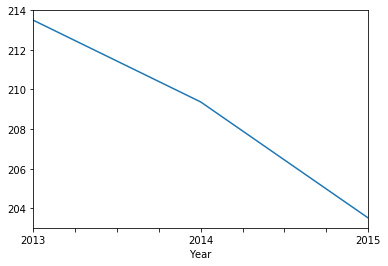

In [224]:
df[df['State'] == 'Oregon'].groupby('Year')['HighQ'].mean().plot()

## Plot the change in marijuana prices in all states over time

In [257]:
df['Date'] = df['Year'] + df['Month'] + df['Day']
df

,State,HighQ,HighQN,MedQ,MedQN,LowQ,LowQN,filename,Day,Month,Year,Date
0,Alabama,339.06,1042,$198.64,933,$149.49,123,data/weedprices01012014.csv,01,01,2014,20140101
1,Alaska,288.75,252,$260.6,297,$388.58,26,data/weedprices01012014.csv,01,01,2014,20140101
2,Arizona,303.31,1941,$209.35,1625,$189.45,222,data/weedprices01012014.csv,01,01,2014,20140101
3,Arkansas,361.85,576,$185.62,544,$125.87,112,data/weedprices01012014.csv,01,01,2014,20140101
4,California,248.78,12096,$193.56,12812,$192.92,778,data/weedprices01012014.csv,01,01,2014,20140101
5,Colorado,236.31,2161,$195.29,1728,$213.5,128,data/weedprices01012014.csv,01,01,2014,20140101
6,Connecticut,347.90,1294,$273.97,1316,$257.36,91,data/weedprices01012014.csv,01,01,2014,20140101
7,Delaware,373.18,347,$226.25,273,$199.88,34,data/weedprices01012014.csv,01,01,2014,20140101
8,District of Columbia,352.26,433,$295.67,349,$213.72,39,data/weedprices01012014.csv,01,01,2014,20140101
9,Florida,306.43,6506,$220.03,5237,$158.26,514,data/weedprices01012014.csv,01,01,2014,20140101


/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


State
Alabama                 Axes(0.125,0.125;0.775x0.755)
Alaska                  Axes(0.125,0.125;0.775x0.755)
Arizona                 Axes(0.125,0.125;0.775x0.755)
Arkansas                Axes(0.125,0.125;0.775x0.755)
California              Axes(0.125,0.125;0.775x0.755)
Colorado                Axes(0.125,0.125;0.775x0.755)
Connecticut             Axes(0.125,0.125;0.775x0.755)
Delaware                Axes(0.125,0.125;0.775x0.755)
District of Columbia    Axes(0.125,0.125;0.775x0.755)
Florida                 Axes(0.125,0.125;0.775x0.755)
Georgia                 Axes(0.125,0.125;0.775x0.755)
Hawaii                  Axes(0.125,0.125;0.775x0.755)
Idaho                   Axes(0.125,0.125;0.775x0.755)
Illinois                Axes(0.125,0.125;0.775x0.755)
Indiana                 Axes(0.125,0.125;0.775x0.755)
Iowa                    Axes(0.125,0.125;0.775x0.755)
Kansas                  Axes(0.125,0.125;0.775x0.755)
Kentucky                Axes(0.125,0.125;0.775x0.755)
Louisiana             

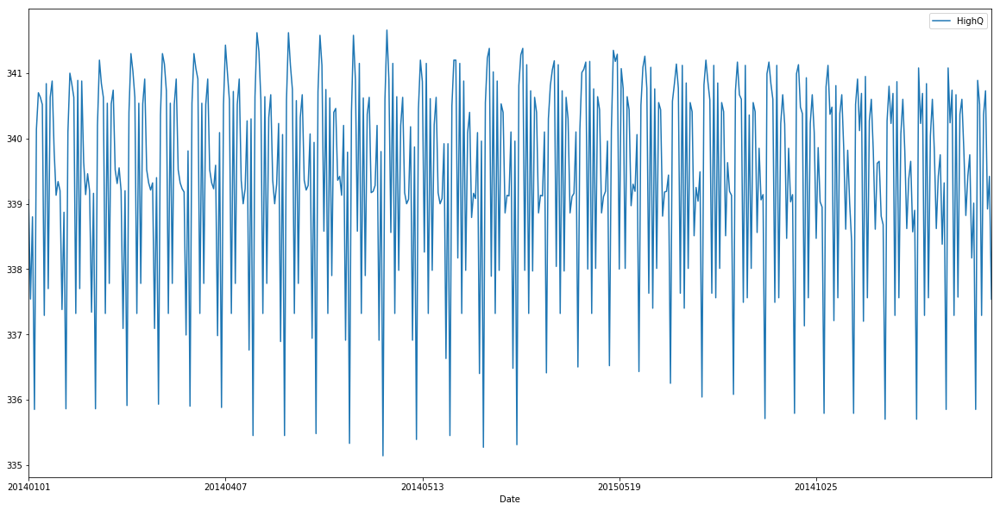

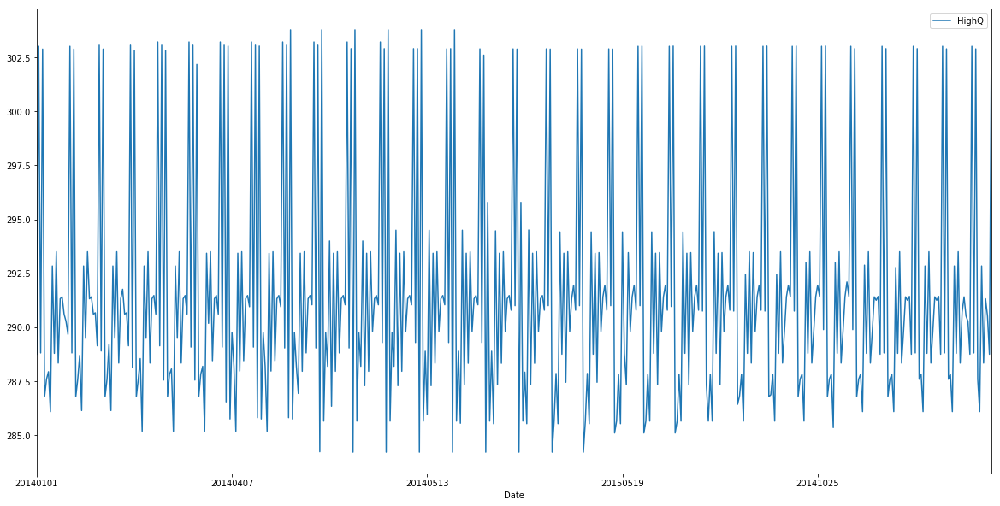

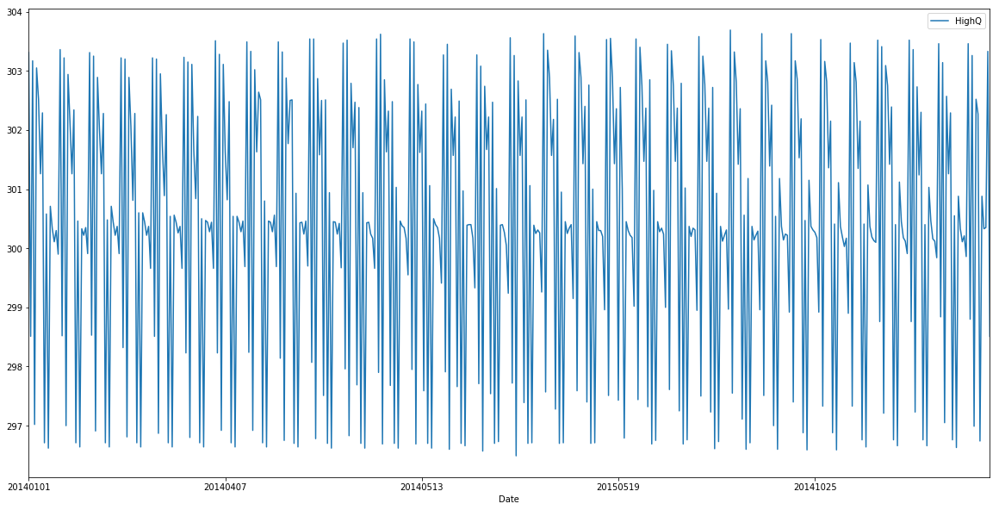

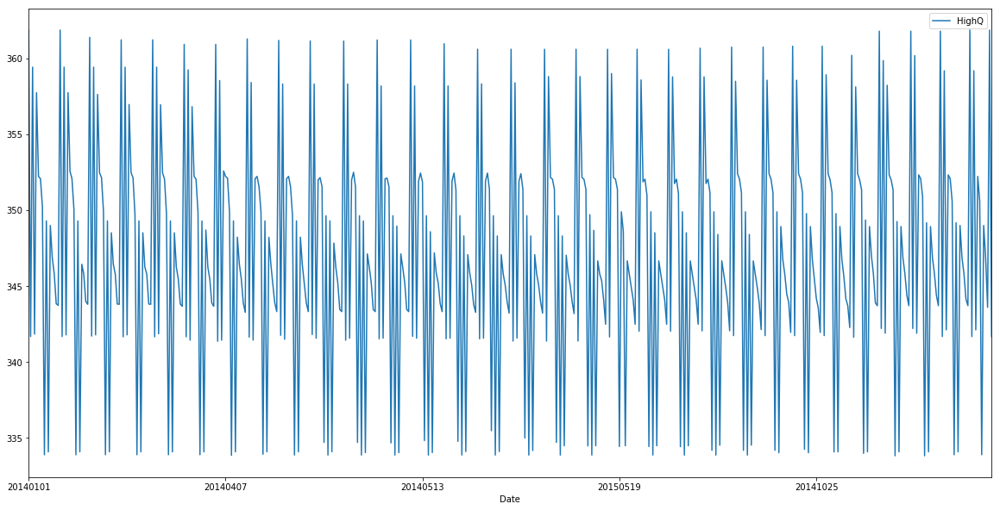

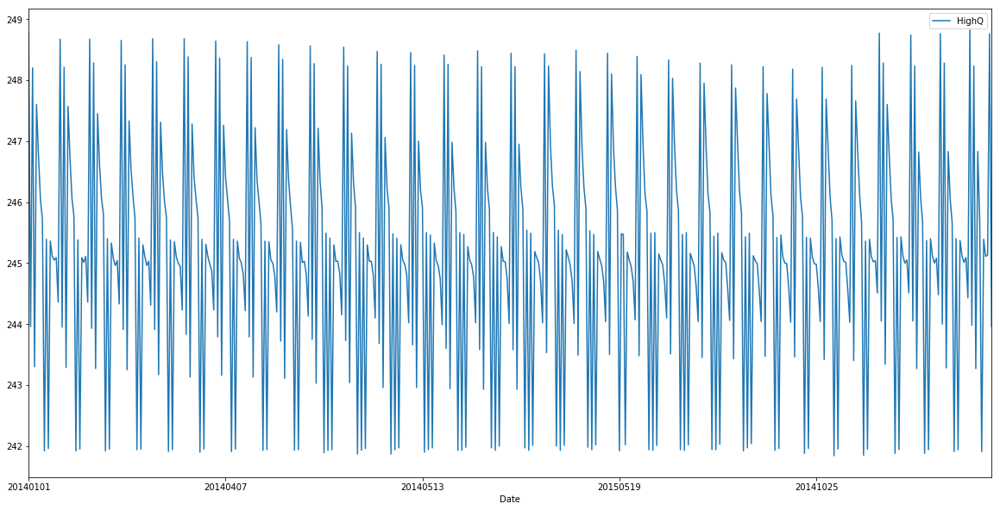

...

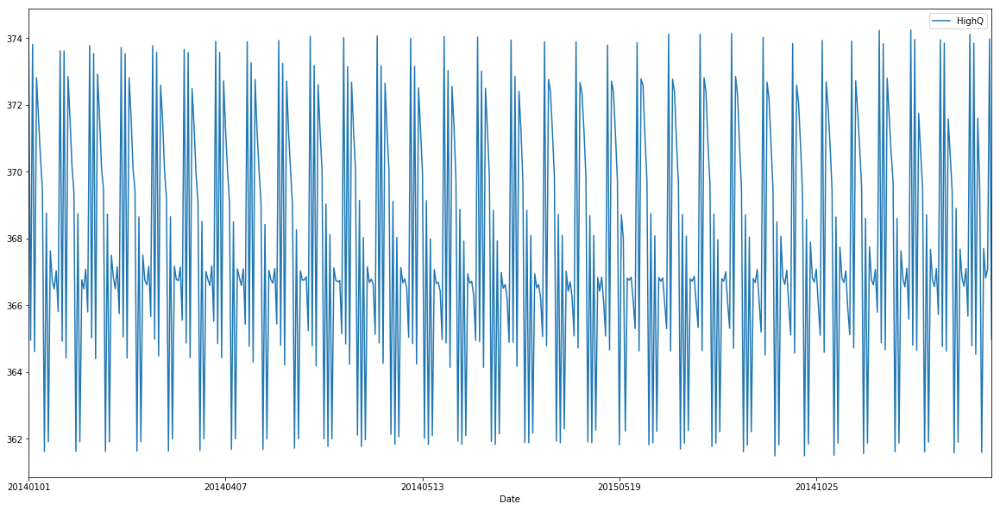

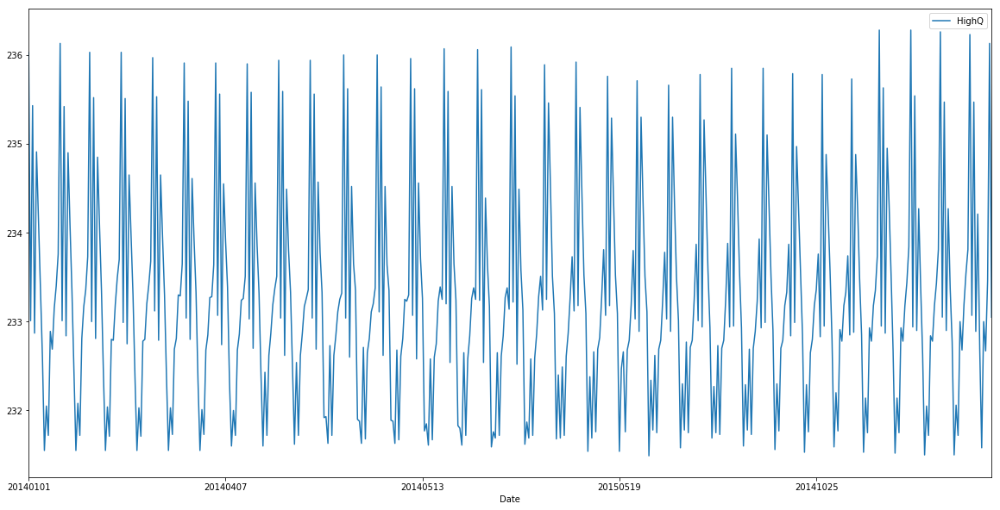

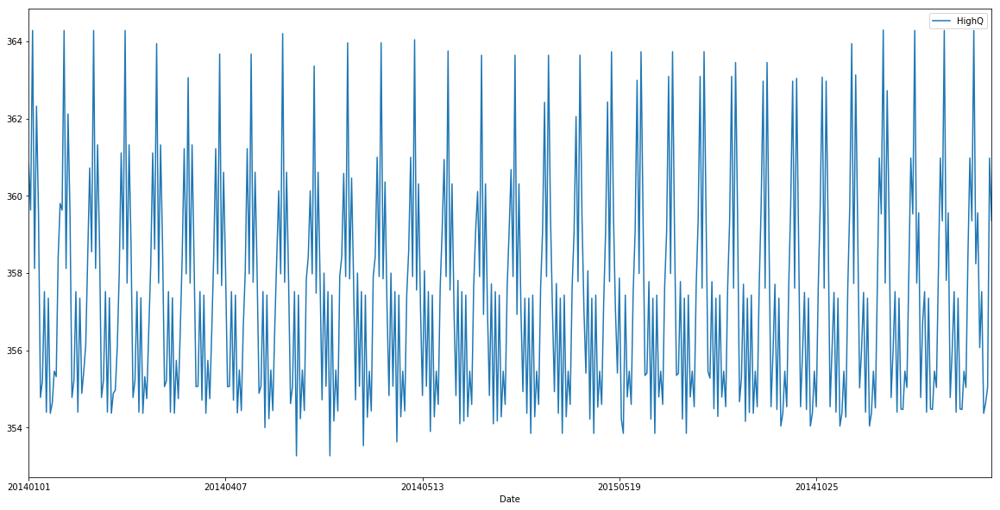

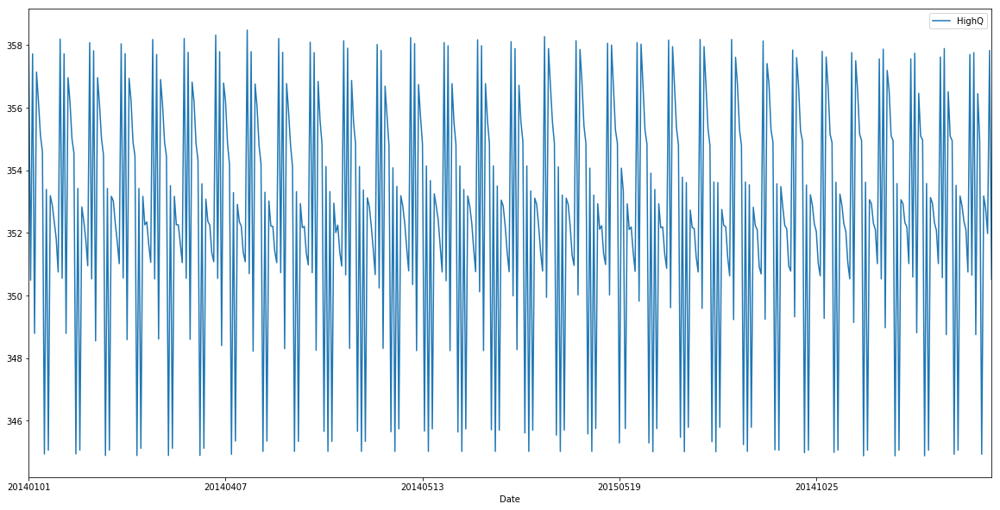

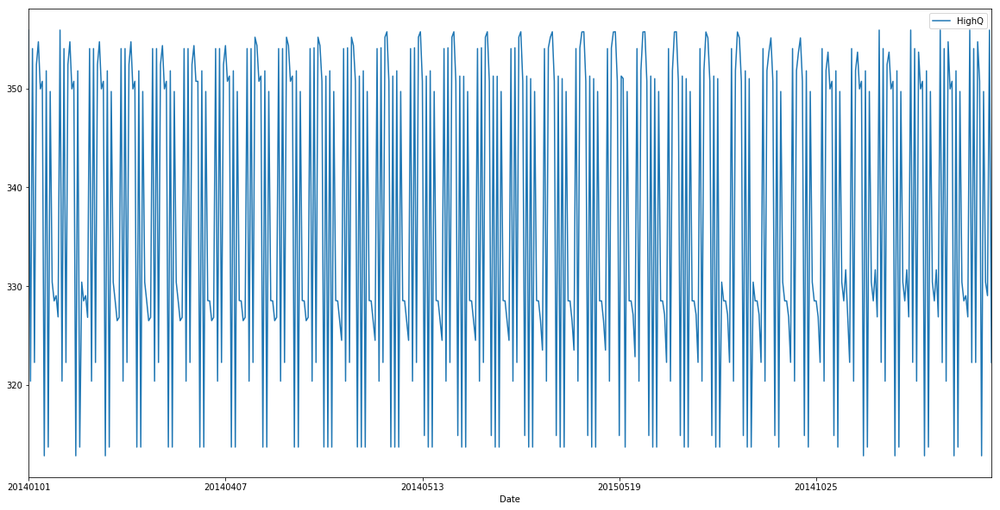

In [263]:
df.groupby('State').plot(x ='Date', y='HighQ', figsize=(20,10))